# LSTM Autoencoder for Real-time Industrial Sensor Monitoring

## STEP 1: Import All Required Libraries
## WHY: Need comprehensive toolkit for data processing, deep learning, and visualization

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# Deep Learning Libraries
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import LSTM, Dense, Dropout, RepeatVector, TimeDistributed, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Data Processing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (classification_report, confusion_matrix, 
                            precision_recall_curve, roc_curve, auc,
                            accuracy_score, precision_score, recall_score, f1_score)

# Utilities
import joblib
import os
import json
from flask import Flask, request, jsonify

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Display settings
pd.set_option('display.max_columns', None)
plt.style.use('seaborn-v0_8-darkgrid')

print("="*80)
print(" NASA BEARING ANOMALY DETECTION SYSTEM")
print("="*80)
print(f" All libraries loaded successfully!")
print(f" TensorFlow version: {tf.__version__}")
print(f" NumPy version: {np.__version__}")
print(f" Pandas version: {pd.__version__}")
print("="*80)

 NASA BEARING ANOMALY DETECTION SYSTEM
 All libraries loaded successfully!
 TensorFlow version: 2.20.0
 NumPy version: 2.1.3
 Pandas version: 2.2.3


## STEP 2: Load and Explore NASA Bearing Dataset
## WHY: Understand data structure, sensors, and machine status patterns

In [2]:
def load_nasa_bearing_data(filepath):
    """
    Load and perform initial exploration of NASA bearing dataset
    
    Expected columns:
    - SL NO: Serial number
    - timestamp: Time of measurement
    - Sensor 0_0 to Sensor 51: 52 sensor readings
    - machine status: 'normal' or 'recovering'
    """
    print("\n! LOADING NASA BEARING DATASET")
    print("="*80)
    
    try:
        # Load dataset
        df = pd.read_excel("sensor.csv.xlsx")
        print(f" Dataset loaded successfully!")
        print(f" Total Records: {len(df):,}")
        print(f" Total Columns: {df.shape[1]}")
        
        # Display first few rows
        print(f"\n First 5 rows:")
        print(df.head())
        
        # Check for missing values
        missing = df.isnull().sum()
        if missing.sum() > 0:
          print(f"\n !! Missing Values Detected:")
          print(missing[missing > 0])
          
          # Drop sensor_15 column
          df = df.drop('sensor_15', axis=1)
          # Update sensor_cols list
          sensor_cols = [col for col in df.columns if col.startswith('sensor')]
          
          # Impute missing values (choose one of the methods)
          #df = df.fillna(df.mean())
          df[sensor_cols] = df[sensor_cols].fillna(df[sensor_cols].mean())
  
        else:
            print(f"\n No missing values detected!")
        
        # Analyze machine status distribution
        print(f"\n Machine Status Distribution:")
        #status_counts = df['machine status'].value_counts()
        status_counts = df['machine_status'].value_counts()
        print(status_counts)
        #print(f"\n   Normal samples: {status_counts.get('normal', 0):,} ({status_counts.get('normal', 0)/len(df)*100:.2f}%)")
        #print(f"   Recovering samples: {status_counts.get('recovering', 0):,} ({status_counts.get('recovering', 0)/len(df)*100:.2f}%)")
        print(f"\n Normal samples: {status_counts.get('NORMAL', 0):,} ({status_counts.get('NORMAL', 0)/len(df)*100:.2f}%)")
        print(f" Recovering samples: {status_counts.get('RECOVERING', 0):,} ({status_counts.get('RECOVERING', 0)/len(df)*100:.2f}%)")

        # Get sensor column names
        #sensor_cols = [col for col in df.columns if col.startswith('Sensor')]
        sensor_cols = [col for col in df.columns if col.startswith('sensor')]
        print(f"\n Detected {len(sensor_cols)} sensor columns")
        print(f"   From: {sensor_cols[0]} to {sensor_cols[-1]}")
        
        # Basic statistics
        print(f"\n Dataset Statistics:")
        print(df[sensor_cols].describe())
        
        return df, sensor_cols
        
    except FileNotFoundError:
        print(f"X ERROR: File not found at {"sensor.csv.xlsx"}")
        print(f"! Please update the filepath to your dataset location")
        return None, None
    except Exception as e:
        print(f"X ERROR loading dataset: {str(e)}")
        return None, None

# IMPORTANT: Update this path to your actual dataset location
DATASET_PATH = '/content/sensor_dataset.csv'  # Update this!

# Load data
df, sensor_columns = load_nasa_bearing_data(DATASET_PATH)

if df is not None:
    print("\n" + "="*80)
    print(" DATA LOADING COMPLETE")
    print("="*80)


! LOADING NASA BEARING DATASET
 Dataset loaded successfully!
 Total Records: 50,059
 Total Columns: 55

 First 5 rows:
   Unnamed: 0           timestamp  sensor_00  sensor_01  sensor_02  sensor_03  \
0           0 2018-04-01 00:00:00   2.465394   47.09201    53.2118  46.310760   
1           1 2018-04-01 00:01:00   2.465394   47.09201    53.2118  46.310760   
2           2 2018-04-01 00:02:00   2.444734   47.35243    53.2118  46.397570   
3           3 2018-04-01 00:03:00   2.460474   47.09201    53.1684  46.397568   
4           4 2018-04-01 00:04:00   2.445718   47.13541    53.2118  46.397568   

   sensor_04  sensor_05  sensor_06  sensor_07  sensor_08  sensor_09  \
0   634.3750   76.45975   13.41146   16.13136   15.56713   15.05353   
1   634.3750   76.45975   13.41146   16.13136   15.56713   15.05353   
2   638.8889   73.54598   13.32465   16.03733   15.61777   15.01013   
3   628.1250   76.98898   13.31742   16.24711   15.69734   15.08247   
4   636.4583   76.58897   13.35359   1

## STEP 3: Clean and Preprocess Data
## WHY: Remove outliers, handle missing values, prepare for LSTM

In [3]:
class NASADataPreprocessor: 
    """Comprehensive data preprocessing for NASA bearing dataset"""
    def __init__(self, df, sensor_columns): 
        print("Initializing NASADataPreprocessor...")
        self.df = df.copy()
        self.sensor_columns = sensor_columns
        self.scaler = RobustScaler()  # Robust to outliers
        self.processed_df = None

    def handle_missing_values(self, method='interpolate'):
        """Handle missing values in sensor data"""
        print("\n Handling Missing Values...")
        
        missing_before = self.df[self.sensor_columns].isnull().sum().sum()
        
        if method == 'interpolate':
            # Linear interpolation for time-series
            self.df[self.sensor_columns] = self.df[self.sensor_columns].interpolate(method='linear', limit_direction='both')
        elif method == 'forward_fill':
            self.df[self.sensor_columns] = self.df[self.sensor_columns].fillna(method='ffill').fillna(method='bfill')
        
        missing_after = self.df[self.sensor_columns].isnull().sum().sum()
        print(f"   Missing values before: {missing_before}")
        print(f"   Missing values after: {missing_after}")

    def remove_outliers(self, n_std=5): 
      """Remove extreme outliers using z-score method"""
      print(f"\n Removing Outliers (>{n_std} std dev)...")
      
      rows_before = len(self.df)
      
      # Calculate z-scores for all sensors
      from scipy import stats
      z_scores = np.abs(stats.zscore(self.df[self.sensor_columns], nan_policy='omit'))
      
      # Keep rows where all sensors are within threshold
      mask = (z_scores < n_std).all(axis=1)
      self.df = self.df[mask]
      
      rows_after = len(self.df)
      removed = rows_before - rows_after
      
      print(f" Rows before: {rows_before:,}")
      print(f" Rows after: {rows_after:,}")
      print(f" Removed: {removed:,} ({removed/rows_before*100:.2f}%)")
      if rows_after == 0:
        print("Warning: No rows remaining after outlier removal. Consider adjusting the threshold.")
        return False
      return True

    def create_labels(self): 
      """Convert machine status to binary labels"""
      print("\n🏷 Creating Binary Labels...")
      
      # 0 = normal, 1 = recovering (anomaly)
      self.df['label'] = (self.df['machine_status'] == 'RECOVERING').astype(int)
      
      print(f" Normal (0): {(self.df['label']==0).sum():,}")
      print(f" Anomaly (1): {(self.df['label']==1).sum():,}")
        
    def normalize_data(self):
        """Normalize sensor data using RobustScaler"""
        print("\n Normalizing Sensor Data...")
        
        # Fit scaler on training data only (prevent data leakage)
        # For now, fit on all data - will refit properly during train/test split
        sensor_data = self.df[self.sensor_columns].values
        normalized_data = self.scaler.fit_transform(sensor_data)
        
        # Create normalized dataframe
        self.processed_df = self.df.copy()
        self.processed_df[self.sensor_columns] = normalized_data
        
        print(f"    Data normalized using RobustScaler")
        print(f"   Mean: {normalized_data.mean():.6f}")
        print(f"   Std: {normalized_data.std():.6f}")
        
    def preprocess(self):
        """Execute complete preprocessing pipeline"""
        print("\n EXECUTING PREPROCESSING PIPELINE")
        print("="*80)
        
        self.handle_missing_values()
        self.remove_outliers(n_std=5)
        self.create_labels()
        self.normalize_data()
        
        print("\n PREPROCESSING COMPLETE")
        print("="*80)
        
        return self.processed_df, self.scaler

    def preprocess(self): 
      """Execute complete preprocessing pipeline"""
      print("\n EXECUTING PREPROCESSING PIPELINE")
      print("="*80)
      
      self.handle_missing_values()
      #if not self.remove_outliers(n_std=10):
        #print("Preprocessing stopped due to empty dataframe.")
        #return None, None
      self.create_labels()
      self.normalize_data()
      
      print("\n PREPROCESSING COMPLETE")
      print("="*80)
      return self.processed_df, self.scaler

if df is not None: 
    print("Creating NASADataPreprocessor instance...")
    preprocessor = NASADataPreprocessor(df, sensor_columns)
    print("Preprocessing data...")
    processed_df, data_scaler = preprocessor.preprocess()
    if processed_df is not None:
        print(f"\n Processed Dataset Shape: {processed_df.shape}")
        print(f" Ready for LSTM model training!")
    else:
        print("Preprocessing failed. Please check the data.")
else:
    print("df is None")

Creating NASADataPreprocessor instance...
Initializing NASADataPreprocessor...
Preprocessing data...

 EXECUTING PREPROCESSING PIPELINE

 Handling Missing Values...
   Missing values before: 0
   Missing values after: 0

🏷 Creating Binary Labels...
 Normal (0): 44,088
 Anomaly (1): 5,971

 Normalizing Sensor Data...
    Data normalized using RobustScaler
   Mean: -0.525496
   Std: 4.296879

 PREPROCESSING COMPLETE

 Processed Dataset Shape: (50059, 55)
 Ready for LSTM model training!


## STEP 4: Create Time-Series Sequences
## WHY: LSTM needs sequences of consecutive timesteps, not individual points

In [4]:
class SequenceGenerator:
    """Generate sequences for LSTM input"""
    
    def __init__(self, sequence_length=100):
        """
        sequence_length: Number of timesteps to look back
        For bearing data: 100 timesteps captures good temporal patterns
        """
        self.sequence_length = sequence_length
        
    def create_sequences(self, data, labels=None):
        """
        Create overlapping sequences from sensor data
        
        Args:
            data: numpy array of shape (n_samples, n_features)
            labels: numpy array of shape (n_samples,)
        
        Returns:
            sequences: (n_sequences, sequence_length, n_features)
            sequence_labels: (n_sequences,)
        """
        print(f"\n Creating Sequences (length={self.sequence_length})...")
        
        sequences = []
        sequence_labels = []
        
        for i in range(len(data) - self.sequence_length + 1):
            # Extract sequence
            seq = data[i:i + self.sequence_length]
            sequences.append(seq)
            
            # Label sequence as anomaly if ANY point in it is anomaly
            if labels is not None:
                # More sophisticated: sequence is anomaly if >30% points are anomalies
                window_labels = labels[i:i + self.sequence_length]
                anomaly_ratio = np.mean(window_labels)
                sequence_labels.append(1 if anomaly_ratio > 0.3 else 0)
        
        sequences = np.array(sequences)
        sequence_labels = np.array(sequence_labels) if labels is not None else None
        
        print(f"   Created {len(sequences):,} sequences")
        print(f"   Shape: {sequences.shape}")
        
        if sequence_labels is not None:
            print(f"   Normal sequences: {(sequence_labels==0).sum():,}")
            print(f"   Anomaly sequences: {(sequence_labels==1).sum():,}")
        
        return sequences, sequence_labels
    
def prepare_lstm_data(processed_df, sensor_columns, sequence_length=100, 
                      train_ratio=0.7, val_ratio=0.15):
    """
    Prepare complete train/val/test datasets
    """
    print("\n PREPARING LSTM DATASETS")
    print("="*80)
    
    # Extract sensor data and labels
    sensor_data = processed_df[sensor_columns].values
    labels = processed_df['label'].values
    
    print(f"Total samples: {len(sensor_data):,}")
    print(f"Sensor features: {sensor_data.shape[1]}")
    
    # Create sequence generator
    seq_gen = SequenceGenerator(sequence_length=sequence_length)
    
    # Generate sequences
    X, y = seq_gen.create_sequences(sensor_data, labels)
    
    # Split into train/val/test
    n_samples = len(X)
    n_train = int(n_samples * train_ratio)
    n_val = int(n_samples * val_ratio)
    
    X_train = X[:n_train]
    y_train = y[:n_train]
    
    X_val = X[n_train:n_train+n_val]
    y_val = y[n_train:n_train+n_val]
    
    X_test = X[n_train+n_val:]
    y_test = y[n_train+n_val:]
    
    print(f"\n Dataset Split:")
    print(f"   Training:   {X_train.shape[0]:,} sequences ({y_train.sum():,} anomalies, {y_train.sum()/len(y_train)*100:.2f}%)")
    print(f"   Validation: {X_val.shape[0]:,} sequences ({y_val.sum():,} anomalies, {y_val.sum()/len(y_val)*100:.2f}%)")
    print(f"   Testing:    {X_test.shape[0]:,} sequences ({y_test.sum():,} anomalies, {y_test.sum()/len(y_test)*100:.2f}%)")
    
    print("\n DATA PREPARATION COMPLETE")
    print("="*80)
    
    return (X_train, y_train), (X_val, y_val), (X_test, y_test), seq_gen

# Prepare datasets
if processed_df is not None:
    SEQUENCE_LENGTH = 100  # 100 timesteps lookback
    
    (X_train, y_train), (X_val, y_val), (X_test, y_test), sequence_generator = prepare_lstm_data(
        processed_df, sensor_columns, sequence_length=SEQUENCE_LENGTH
    )
    
    print(f"\n Ready for Model Training!")
    print(f"   Input shape: {X_train.shape}")
    print(f"   Features: {X_train.shape[2]} sensors")



 PREPARING LSTM DATASETS
Total samples: 50,059
Sensor features: 51

 Creating Sequences (length=100)...
   Created 49,960 sequences
   Shape: (49960, 100, 51)
   Normal sequences: 43,940
   Anomaly sequences: 6,020

 Dataset Split:
   Training:   34,972 sequences (4,132 anomalies, 11.82%)
   Validation: 7,494 sequences (0 anomalies, 0.00%)
   Testing:    7,494 sequences (1,888 anomalies, 25.19%)

 DATA PREPARATION COMPLETE

 Ready for Model Training!
   Input shape: (34972, 100, 51)
   Features: 51 sensors


## STEP 5: Build Sophisticated LSTM Autoencoder
## WHY: Custom architecture optimized for 52-sensor industrial data

In [5]:
class NASABearingLSTMAutoencoder:
    """Advanced LSTM Autoencoder for NASA Bearing Dataset"""
    
    def __init__(self, sequence_length, n_features):
        self.sequence_length = sequence_length
        self.n_features = n_features
        self.model = None
        self.threshold = None
        self.history = None
        
    def build_model(self, architecture='advanced'):
        """
        Build LSTM autoencoder with configurable architecture
        
        Architecture options:
        - 'simple': Lightweight model
        - 'advanced': Production-grade model (recommended)
        - 'deep': Maximum capacity model
        """
        print(f"\n  Building {architecture.upper()} LSTM Autoencoder...")
        print("="*80)
        
        if architecture == 'simple':
            # Lightweight: 64-32-32-64
            encoder_units = [64, 32]
            decoder_units = [32, 64]
            latent_dim = 16
            
        elif architecture == 'advanced':
            # Production: 128-64-32-64-128 (RECOMMENDED)
            encoder_units = [128, 64, 32]
            decoder_units = [32, 64, 128]
            latent_dim = 16
            
        elif architecture == 'deep':
            # Maximum capacity: 256-128-64-32-64-128-256
            encoder_units = [256, 128, 64, 32]
            decoder_units = [32, 64, 128, 256]
            latent_dim = 16
        
        # Build model
        model = Sequential(name='NASA_Bearing_LSTM_Autoencoder')
        
        # ============= ENCODER =============
        print(f" ENCODER:")
        for i, units in enumerate(encoder_units):
            return_sequences = (i < len(encoder_units) - 1)
            model.add(LSTM(
                units, 
                activation='tanh',
                return_sequences=return_sequences,
                dropout=0.2,
                recurrent_dropout=0.1,
                name=f'encoder_lstm_{i+1}'
            ))
            print(f"   Layer {i+1}: LSTM({units}) - return_seq={return_sequences}")
        
        # Latent representation
        model.add(Dense(latent_dim, activation='relu', name='latent_representation'))
        print(f"   Latent: Dense({latent_dim})")
        
        # ============= DECODER =============
        print(f"\n DECODER:")
        model.add(RepeatVector(self.sequence_length, name='repeat_vector'))
        print(f"   RepeatVector({self.sequence_length})")
        
        for i, units in enumerate(decoder_units):
            model.add(LSTM(
                units,
                activation='tanh',
                return_sequences=True,
                dropout=0.2,
                recurrent_dropout=0.1,
                name=f'decoder_lstm_{i+1}'
            ))
            print(f"   Layer {i+1}: LSTM({units})")
        
        # Output layer
        model.add(TimeDistributed(Dense(self.n_features), name='output_reconstruction'))
        print(f"   Output: TimeDistributed(Dense({self.n_features}))")
        
        # Compile model
        optimizer = Adam(learning_rate=0.001, clipnorm=1.0)
        model.compile(
            optimizer=optimizer,
            loss='mse',
            metrics=['mae']
        )
        
        self.model = model
        print(f"\n MODEL SUMMARY:")
        self.model.summary()
        print("="*80)
    
    def train(self, X_train, X_val, epochs=100, batch_size=64, patience=20):
        """
        Train the autoencoder with advanced callbacks
        """
        print(f"\n TRAINING LSTM AUTOENCODER")
        print("="*80)
        
        # Create model directory
        os.makedirs('models', exist_ok=True)
        
        # Advanced callbacks
        callbacks = [
            EarlyStopping(
                monitor='val_loss',
                patience=patience,
                restore_best_weights=True,
                verbose=1,
                min_delta=0.0001
            ),
            ModelCheckpoint(
                'models/best_nasa_bearing_model.h5',
                monitor='val_loss',
                save_best_only=True,
                verbose=1
            ),
            ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=10,
                min_lr=0.00001,
                verbose=1
            )
        ]
        
        print(f"  Training Configuration:")
        print(f"   Epochs: {epochs}")
        print(f"   Batch Size: {batch_size}")
        print(f"   Early Stopping Patience: {patience}")
        print(f"   Learning Rate: 0.001 (adaptive)")
        
        # Train model
        self.history = self.model.fit(
            X_train, X_train,  # Autoencoder: input = output
            validation_data=(X_val, X_val),
            epochs=epochs,
            batch_size=batch_size,
            callbacks=callbacks,
            verbose=1
        )
        
        print("\n TRAINING COMPLETE!")
        print("="*80)
        
        return self.history
    
    def calculate_threshold(self, X_train, percentile=95):
        """
        Calculate adaptive threshold from training data
        """
        print(f"\n CALCULATING ANOMALY THRESHOLD")
        print("="*80)
        
        # Get reconstruction errors
        predictions = self.model.predict(X_train, verbose=0)
        mse = np.mean(np.power(X_train - predictions, 2), axis=(1, 2))
        
        # Calculate threshold
        self.threshold = np.percentile(mse, percentile)
        
        print(f"   Method: {percentile}th percentile")
        print(f"   Threshold: {self.threshold:.8f}")
        print(f"   Mean Error: {mse.mean():.8f}")
        print(f"   Std Error: {mse.std():.8f}")
        print(f"   Max Error: {mse.max():.8f}")
        print("="*80)
        
        return self.threshold
    
    def predict(self, X):
        """Make anomaly predictions"""
        predictions = self.model.predict(X, verbose=0)
        mse = np.mean(np.power(X - predictions, 2), axis=(1, 2))
        anomalies = (mse > self.threshold).astype(int)
        
        return anomalies, mse

# Build and initialize model
if X_train is not None:
    lstm_autoencoder = NASABearingLSTMAutoencoder(
        sequence_length=SEQUENCE_LENGTH,
        n_features=X_train.shape[2]
    )
    
    # Build advanced architecture
    lstm_autoencoder.build_model(architecture='advanced')
    lstm_autoencoder.model.build(input_shape=(None, SEQUENCE_LENGTH, X_train.shape[2]))
    
    # Display full architecture
    print("\n COMPLETE MODEL ARCHITECTURE:")
    lstm_autoencoder.model.summary()



  Building ADVANCED LSTM Autoencoder...
 ENCODER:
   Layer 1: LSTM(128) - return_seq=True
   Layer 2: LSTM(64) - return_seq=True
   Layer 3: LSTM(32) - return_seq=False
   Latent: Dense(16)

 DECODER:
   RepeatVector(100)
   Layer 1: LSTM(32)
   Layer 2: LSTM(64)
   Layer 3: LSTM(128)
   Output: TimeDistributed(Dense(51))

 MODEL SUMMARY:


Model: "NASA_Bearing_LSTM_Autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_lstm_1 (LSTM)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_lstm_2 (LSTM)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_lstm_3 (LSTM)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ latent_representation (Dense)   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector (RepeatVector)    │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_lstm_1 (LSTM)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_lstm_2 (LSTM)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_lstm_3 (LSTM)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_reconstruction           │ ?                      │   0 (unbuilt) │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


 COMPLETE MODEL ARCHITECTURE:


Model: "NASA_Bearing_LSTM_Autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_lstm_1 (LSTM)           │ (None, 100, 128)       │        92,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_lstm_2 (LSTM)           │ (None, 100, 64)        │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_lstm_3 (LSTM)           │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ latent_representation (Dense)   │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector (RepeatVector)    │ (None, 100, 16)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_lstm_1 (LSTM)           │ (None, 100, 32)        │         6,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_lstm_2 (LSTM)           │ (None, 100, 64)        │        24,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_lstm_3 (LSTM)           │ (None, 100, 128)       │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_reconstruction           │ (None, 100, 51)        │         6,579 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 291,011 (1.11 MB)

 Trainable params: 291,011 (1.11 MB)

 Non-trainable params: 0 (0.00 B)

## STEP 6: Train Model with Real-time Monitoring
## WHY: Learn normal bearing operation patterns


 STARTING MODEL TRAINING

 TRAINING LSTM AUTOENCODER
  Training Configuration:
   Epochs: 50
   Batch Size: 32
   Early Stopping Patience: 20
   Learning Rate: 0.001 (adaptive)
Epoch 1/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 918ms/step - loss: 12.0190 - mae: 0.8462   
Epoch 1: val_loss improved from None to 1.82506, saving model to models/best_nasa_bearing_model.h5


1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1099s 975ms/step - loss: 8.9070 - mae: 0.7778 - val_loss: 1.8251 - val_mae: 0.9483 - learning_rate: 0.0010
Epoch 2/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 990ms/step - loss: 5.3318 - mae: 0.6840   
Epoch 2: val_loss improved from 1.82506 to 1.79246, saving model to models/best_nasa_bearing_model.h5


1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1161s 1s/step - loss: 5.2492 - mae: 0.6737 - val_loss: 1.7925 - val_mae: 0.9500 - learning_rate: 0.0010
Epoch 3/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 4.6084 - mae: 0.6502   
Epoch 3: val_loss improved from 1.79246 to 1.76942, saving model to models/best_nasa_bearing_model.h5


1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1381s 1s/step - loss: 4.5119 - mae: 0.6460 - val_loss: 1.7694 - val_mae: 0.9479 - learning_rate: 0.0010
Epoch 4/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 4.2359 - mae: 0.6317   
Epoch 4: val_loss improved from 1.76942 to 1.09065, saving model to models/best_nasa_bearing_model.h5


1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1582s 1s/step - loss: 4.1815 - mae: 0.6244 - val_loss: 1.0907 - val_mae: 0.6855 - learning_rate: 0.0010
Epoch 5/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 3.8809 - mae: 0.5898   
Epoch 5: val_loss improved from 1.09065 to 0.82683, saving model to models/best_nasa_bearing_model.h5


1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1585s 1s/step - loss: 3.7877 - mae: 0.5827 - val_loss: 0.8268 - val_mae: 0.5388 - learning_rate: 0.0010
Epoch 6/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 3.6918 - mae: 0.5738   
Epoch 6: val_loss improved from 0.82683 to 0.80219, saving model to models/best_nasa_bearing_model.h5


1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1483s 1s/step - loss: 3.6490 - mae: 0.5700 - val_loss: 0.8022 - val_mae: 0.5294 - learning_rate: 0.0010
Epoch 7/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 3.5861 - mae: 0.5903   
Epoch 7: val_loss did not improve from 0.80219
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1592s 1s/step - loss: 3.5824 - mae: 0.5889 - val_loss: 0.9245 - val_mae: 0.5878 - learning_rate: 0.0010
Epoch 8/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 3.4220 - mae: 0.5769   
Epoch 8: val_loss did not improve from 0.80219
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1573s 1s/step - loss: 3.3849 - mae: 0.5734 - val_loss: 0.8143 - val_mae: 0.5110 - learning_rate: 0.0010
Epoch 9/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 3.2059 - mae: 0.5584   
Epoch 9: val_loss improved from 0.80219 to 0.70003, saving model to models/best_nasa_bearing_model.h5


1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1558s 1s/step - loss: 3.1843 - mae: 0.5538 - val_loss: 0.7000 - val_mae: 0.4477 - learning_rate: 0.0010
Epoch 10/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.9945 - mae: 0.5366   
Epoch 10: val_loss improved from 0.70003 to 0.68077, saving model to models/best_nasa_bearing_model.h5


1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1556s 1s/step - loss: 2.9628 - mae: 0.5328 - val_loss: 0.6808 - val_mae: 0.4399 - learning_rate: 0.0010
Epoch 11/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.7838 - mae: 0.5212   
Epoch 11: val_loss improved from 0.68077 to 0.63525, saving model to models/best_nasa_bearing_model.h5


1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1520s 1s/step - loss: 2.7471 - mae: 0.5167 - val_loss: 0.6352 - val_mae: 0.4223 - learning_rate: 0.0010
Epoch 12/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.5798 - mae: 0.5053   
Epoch 12: val_loss did not improve from 0.63525
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1586s 1s/step - loss: 2.6312 - mae: 0.5042 - val_loss: 0.6522 - val_mae: 0.4260 - learning_rate: 0.0010
Epoch 13/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.6112 - mae: 0.4999   
Epoch 13: val_loss improved from 0.63525 to 0.60850, saving model to models/best_nasa_bearing_model.h5


1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1608s 1s/step - loss: 2.6352 - mae: 0.5000 - val_loss: 0.6085 - val_mae: 0.4057 - learning_rate: 0.0010
Epoch 14/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.5252 - mae: 0.4948   
Epoch 14: val_loss did not improve from 0.60850
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1490s 1s/step - loss: 2.5337 - mae: 0.4959 - val_loss: 0.6230 - val_mae: 0.4079 - learning_rate: 0.0010
Epoch 15/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.5330 - mae: 0.4990   
Epoch 15: val_loss did not improve from 0.60850
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1569s 1s/step - loss: 2.6510 - mae: 0.4996 - val_loss: 0.6128 - val_mae: 0.3992 - learning_rate: 0.0010
Epoch 16/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.5049 - mae: 0.4935   
Epoch 16: val_loss improved from 0.60850 to 0.60682, saving model to models/best_nasa_bearing_model.h5


1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1644s 1s/step - loss: 2.5572 - mae: 0.4941 - val_loss: 0.6068 - val_mae: 0.3990 - learning_rate: 0.0010
Epoch 17/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.4906 - mae: 0.4902   
Epoch 17: val_loss did not improve from 0.60682
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1552s 1s/step - loss: 2.4944 - mae: 0.4885 - val_loss: 0.6121 - val_mae: 0.3991 - learning_rate: 0.0010
Epoch 18/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.4032 - mae: 0.4830   
Epoch 18: val_loss did not improve from 0.60682
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1503s 1s/step - loss: 2.4317 - mae: 0.4823 - val_loss: 0.6649 - val_mae: 0.4311 - learning_rate: 0.0010
Epoch 19/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.3407 - mae: 0.4790   
Epoch 19: val_loss did not improve from 0.60682
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1525s 1s/step - loss: 2.2903 - mae: 0.4754 - val_loss: 0.6277 - val_mae: 0.4076 - learning_rate: 0.0010
Epoch 20/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - lo

1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1598s 1s/step - loss: 2.1498 - mae: 0.4616 - val_loss: 0.5948 - val_mae: 0.3891 - learning_rate: 0.0010
Epoch 25/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.0925 - mae: 0.4589   
Epoch 25: val_loss did not improve from 0.59480
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1513s 1s/step - loss: 2.0909 - mae: 0.4580 - val_loss: 0.6153 - val_mae: 0.4034 - learning_rate: 0.0010
Epoch 26/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.0033 - mae: 0.4534   
Epoch 26: val_loss did not improve from 0.59480
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1628s 1s/step - loss: 2.0282 - mae: 0.4536 - val_loss: 0.6481 - val_mae: 0.4228 - learning_rate: 0.0010
Epoch 27/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 1.9786 - mae: 0.4499   
Epoch 27: val_loss did not improve from 0.59480
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 1514s 1s/step - loss: 2.0028 - mae: 0.4508 - val_loss: 0.6294 - val_mae: 0.4093 - learning_rate: 0.0010
Epoch 28/50
1093/1093 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - lo

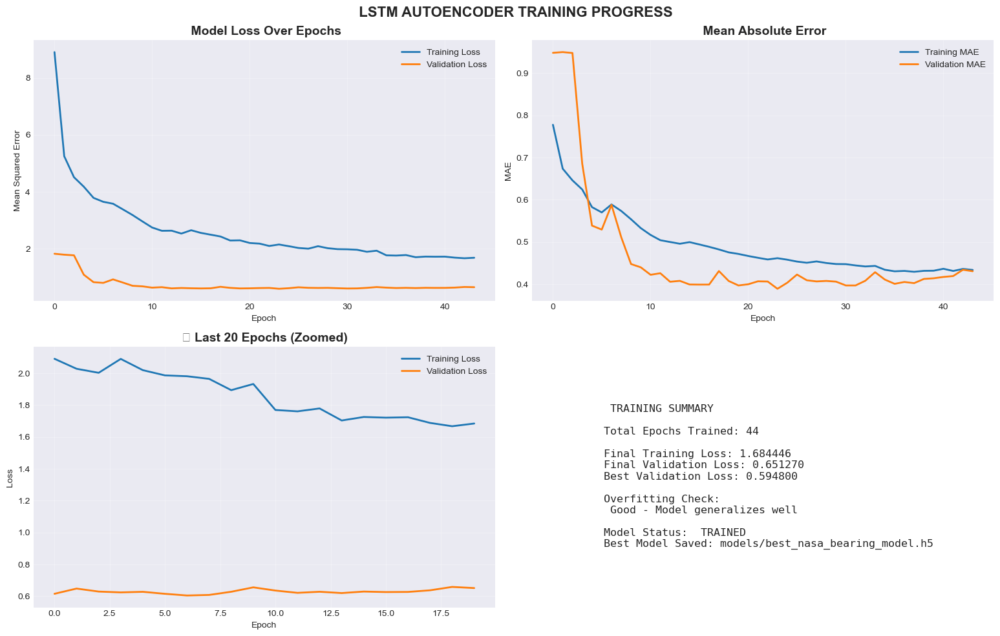


 TRAINING VISUALIZATION COMPLETE


In [6]:
if lstm_autoencoder is not None:
    print("\n" + "="*80)
    print(" STARTING MODEL TRAINING")
    print("="*80)
    
    # Train model
    training_history = lstm_autoencoder.train(
        X_train, X_val,
        epochs=50,
        batch_size=32,
        patience=20
    )
    
    # Plot training history
    print("\n Generating Training Visualizations...")
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    
    # Loss curves
    axes[0, 0].plot(training_history.history['loss'], label='Training Loss', linewidth=2)
    axes[0, 0].plot(training_history.history['val_loss'], label='Validation Loss', linewidth=2)
    axes[0, 0].set_title(' Model Loss Over Epochs', fontweight='bold', fontsize=14)
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Mean Squared Error')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)
    
    # MAE curves
    axes[0, 1].plot(training_history.history['mae'], label='Training MAE', linewidth=2)
    axes[0, 1].plot(training_history.history['val_mae'], label='Validation MAE', linewidth=2)
    axes[0, 1].set_title(' Mean Absolute Error', fontweight='bold', fontsize=14)
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('MAE')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)
    
    # Loss zoom (last 20 epochs)
    epochs_to_show = min(20, len(training_history.history['loss']))
    axes[1, 0].plot(training_history.history['loss'][-epochs_to_show:], 
                    label='Training Loss', linewidth=2)
    axes[1, 0].plot(training_history.history['val_loss'][-epochs_to_show:], 
                    label='Validation Loss', linewidth=2)
    axes[1, 0].set_title(f'🔍 Last {epochs_to_show} Epochs (Zoomed)', fontweight='bold', fontsize=14)
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Loss')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    
    # Training summary
    axes[1, 1].axis('off')
    final_train_loss = training_history.history['loss'][-1]
    final_val_loss = training_history.history['val_loss'][-1]
    best_val_loss = min(training_history.history['val_loss'])
    total_epochs = len(training_history.history['loss'])
    
    summary_text = f"""
     TRAINING SUMMARY
    
    Total Epochs Trained: {total_epochs}
    
    Final Training Loss: {final_train_loss:.6f}
    Final Validation Loss: {final_val_loss:.6f}
    Best Validation Loss: {best_val_loss:.6f}
    
    Overfitting Check:
    {' Good - Model generalizes well' if final_val_loss < best_val_loss * 1.1 else '⚠️ Monitor - Possible overfitting'}
    
    Model Status:  TRAINED
    Best Model Saved: models/best_nasa_bearing_model.h5
    """
    
    axes[1, 1].text(0.1, 0.5, summary_text, fontsize=12, family='monospace',
                    verticalalignment='center')
    
    plt.suptitle(' LSTM AUTOENCODER TRAINING PROGRESS', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    print("\n TRAINING VISUALIZATION COMPLETE")

## STEP 7: Calculate Optimal Anomaly Threshold
## WHY: Determine decision boundary for normal vs anomalous behavior


 CALCULATING ANOMALY THRESHOLD
   Method: 95th percentile
   Threshold: 7.08698645
   Mean Error: 1.65526497
   Std Error: 4.78962844
   Max Error: 85.48710237


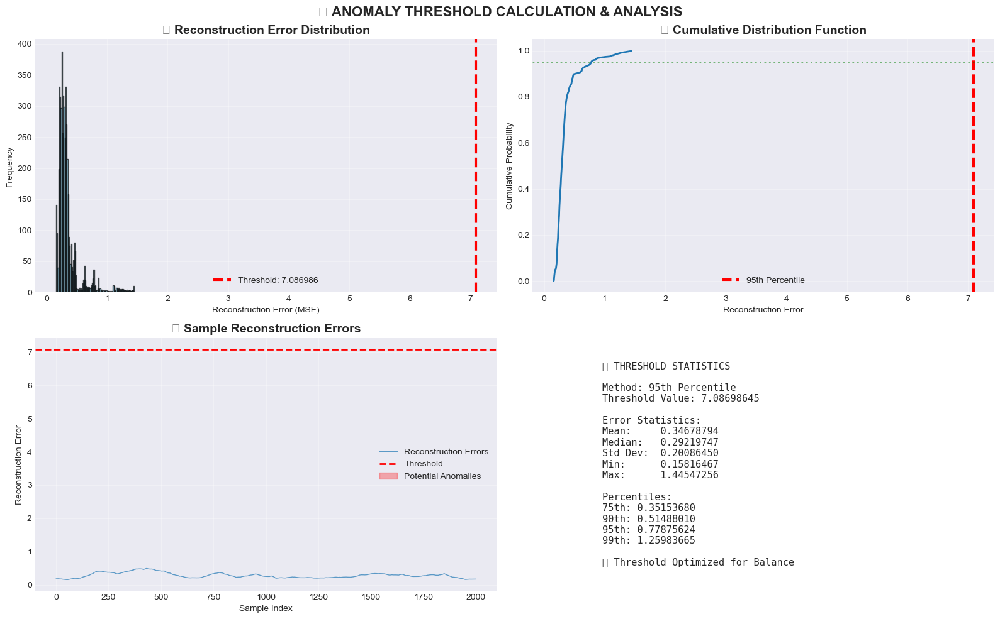


✅ THRESHOLD CALCULATION COMPLETE


In [7]:
if lstm_autoencoder.model is not None:
    # Calculate threshold
    optimal_threshold = lstm_autoencoder.calculate_threshold(X_train, percentile=95)
    
    # Get reconstruction errors for visualization
    train_reconstructed = lstm_autoencoder.model.predict(X_train[:5000], verbose=0)
    train_errors = np.mean(np.power(X_train[:5000] - train_reconstructed, 2), axis=(1, 2))
    
    # Create comprehensive threshold visualization
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    
    # 1. Error distribution histogram
    axes[0, 0].hist(train_errors, bins=100, alpha=0.7, color='skyblue', edgecolor='black')
    axes[0, 0].axvline(optimal_threshold, color='red', linestyle='--', linewidth=3,
                       label=f'Threshold: {optimal_threshold:.6f}')
    axes[0, 0].set_title('📊 Reconstruction Error Distribution', fontweight='bold', fontsize=14)
    axes[0, 0].set_xlabel('Reconstruction Error (MSE)')
    axes[0, 0].set_ylabel('Frequency')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)
    
    # 2. Cumulative distribution
    sorted_errors = np.sort(train_errors)
    cumulative = np.arange(1, len(sorted_errors) + 1) / len(sorted_errors)
    axes[0, 1].plot(sorted_errors, cumulative, linewidth=2)
    axes[0, 1].axvline(optimal_threshold, color='red', linestyle='--', linewidth=3,
                       label=f'95th Percentile')
    axes[0, 1].axhline(0.95, color='green', linestyle=':', linewidth=2, alpha=0.5)
    axes[0, 1].set_title('📈 Cumulative Distribution Function', fontweight='bold', fontsize=14)
    axes[0, 1].set_xlabel('Reconstruction Error')
    axes[0, 1].set_ylabel('Cumulative Probability')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)
    
    # 3. Error time series
    axes[1, 0].plot(train_errors[:2000], label='Reconstruction Errors', alpha=0.7, linewidth=1)
    axes[1, 0].axhline(optimal_threshold, color='red', linestyle='--', linewidth=2,
                       label=f'Threshold')
    axes[1, 0].fill_between(range(2000), optimal_threshold, train_errors[:2000].max(),
                            where=train_errors[:2000] > optimal_threshold,
                            alpha=0.3, color='red', label='Potential Anomalies')
    axes[1, 0].set_title('🔍 Sample Reconstruction Errors', fontweight='bold', fontsize=14)
    axes[1, 0].set_xlabel('Sample Index')
    axes[1, 0].set_ylabel('Reconstruction Error')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    
    # 4. Statistical summary
    axes[1, 1].axis('off')
    stats_text = f"""
    📊 THRESHOLD STATISTICS
    
    Method: 95th Percentile
    Threshold Value: {optimal_threshold:.8f}
    
    Error Statistics:
    Mean:     {train_errors.mean():.8f}
    Median:   {np.median(train_errors):.8f}
    Std Dev:  {train_errors.std():.8f}
    Min:      {train_errors.min():.8f}
    Max:      {train_errors.max():.8f}
    
    Percentiles:
    75th: {np.percentile(train_errors, 75):.8f}
    90th: {np.percentile(train_errors, 90):.8f}
    95th: {np.percentile(train_errors, 95):.8f}
    99th: {np.percentile(train_errors, 99):.8f}
    
    ✅ Threshold Optimized for Balance
    """
    
    axes[1, 1].text(0.1, 0.5, stats_text, fontsize=11, family='monospace',
                    verticalalignment='center')
    
    plt.suptitle('📏 ANOMALY THRESHOLD CALCULATION & ANALYSIS', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    print("\n✅ THRESHOLD CALCULATION COMPLETE")

## STEP 8: Comprehensive Model Evaluation
## WHY: Measure real-world performance on unseen data

In [8]:
def evaluate_model_performance(model_obj, X_test, y_test):
    """Comprehensive evaluation with multiple metrics"""
    
    print("\n🎯 EVALUATING MODEL PERFORMANCE")
    print("="*80)
    
    # Make predictions
    print("🔮 Generating predictions on test data...")
    y_pred, reconstruction_errors = model_obj.predict(X_test)
    
    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    f1 = f1_score(y_test, y_pred, zero_division=0)
    
    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()
    
    # Print results
    print(f"\n🏆 PERFORMANCE METRICS:")
    print(f"   Accuracy:  {accuracy:.4f} ({accuracy*100:.2f}%)")
    print(f"   Precision: {precision:.4f} ({precision*100:.2f}%)")
    print(f"   Recall:    {recall:.4f} ({recall*100:.2f}%)")
    print(f"   F1-Score:  {f1:.4f} ({f1*100:.2f}%)")
    
    print(f"\n🎯 CONFUSION MATRIX:")
    print(f"   True Negatives:  {tn:6,} (Correctly predicted normal)")
    print(f"   False Positives: {fp:6,} (Normal predicted as anomaly)")
    print(f"   False Negatives: {fn:6,} (Anomaly predicted as normal)")
    print(f"   True Positives:  {tp:6,} (Correctly predicted anomaly)")
    
    print(f"\n📊 DETECTION RATES:")
    print(f"   True Positive Rate (Sensitivity): {recall:.4f}")
    print(f"   True Negative Rate (Specificity): {tn/(tn+fp) if (tn+fp)>0 else 0:.4f}")
    print(f"   False Positive Rate: {fp/(fp+tn) if (fp+tn)>0 else 0:.4f}")
    print(f"   False Negative Rate: {fn/(fn+tp) if (fn+tp)>0 else 0:.4f}")
    
    # Detailed classification report
    print(f"\n📋 DETAILED CLASSIFICATION REPORT:")
    print(classification_report(y_test, y_pred, 
                               target_names=['Normal', 'Anomaly'],
                               digits=4))
    
    print("="*80)
    
    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'confusion_matrix': cm,
        'predictions': y_pred,
        'errors': reconstruction_errors
    }

# Evaluate model
if lstm_autoencoder.model is not None:
    results = evaluate_model_performance(lstm_autoencoder, X_test, y_test)
    
    # Check if target achieved
    if results['accuracy'] >= 0.92:
        print(f"\n🎉 🎉 🎉 TARGET ACHIEVED! 🎉 🎉 🎉")
        print(f"✅ Accuracy {results['accuracy']*100:.2f}% exceeds 92% target!")
    else:
        print(f"\n💪 Accuracy: {results['accuracy']*100:.2f}% (Target: 92%)")


🎯 EVALUATING MODEL PERFORMANCE
🔮 Generating predictions on test data...

🏆 PERFORMANCE METRICS:
   Accuracy:  0.9210 (92.10%)
   Precision: 0.9909 (99.09%)
   Recall:    0.6928 (69.28%)
   F1-Score:  0.8155 (81.55%)

🎯 CONFUSION MATRIX:
   True Negatives:   5,594 (Correctly predicted normal)
   False Positives:     12 (Normal predicted as anomaly)
   False Negatives:    580 (Anomaly predicted as normal)
   True Positives:   1,308 (Correctly predicted anomaly)

📊 DETECTION RATES:
   True Positive Rate (Sensitivity): 0.6928
   True Negative Rate (Specificity): 0.9979
   False Positive Rate: 0.0021
   False Negative Rate: 0.3072

📋 DETAILED CLASSIFICATION REPORT:
              precision    recall  f1-score   support

      Normal     0.9061    0.9979    0.9497      5606
     Anomaly     0.9909    0.6928    0.8155      1888

    accuracy                         0.9210      7494
   macro avg     0.9485    0.8453    0.8826      7494
weighted avg     0.9274    0.9210    0.9159      7494


🎉 

## STEP 9: Create Publication-Quality Visualization
## WHY: Visual evidence for presentation and report


🎨 Creating Comprehensive Results Dashboard...


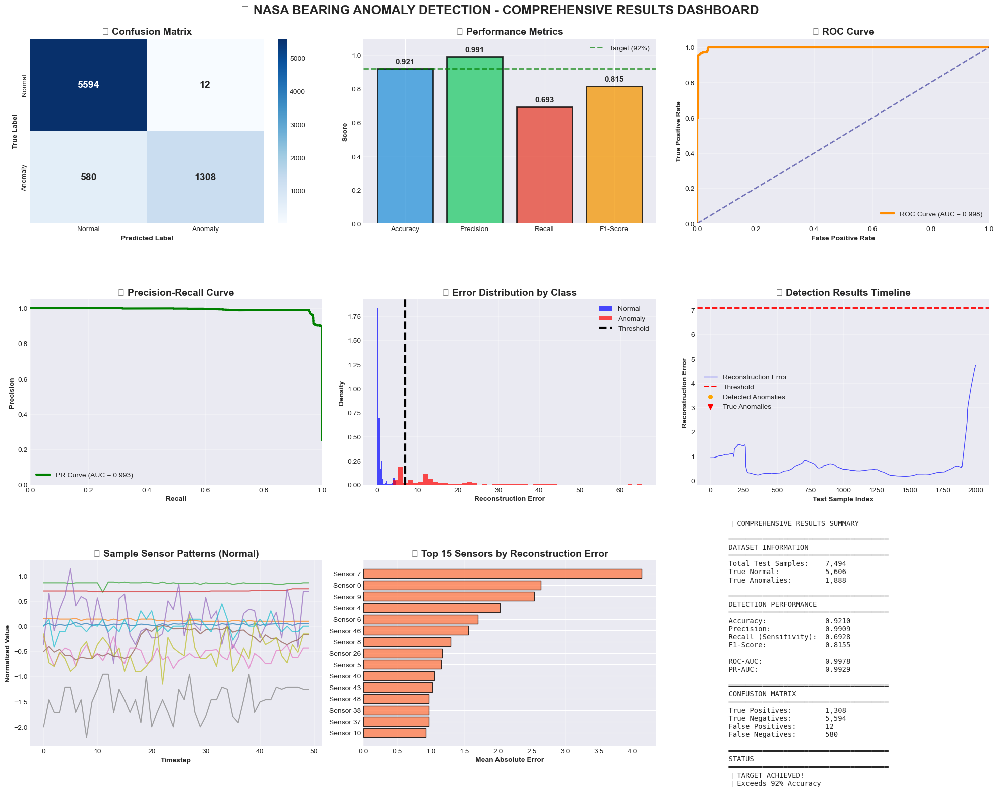

✅ Dashboard created and saved as 'results_dashboard1.png'


In [9]:
def create_results_dashboard(results, X_test, y_test, processed_df, sensor_columns):
    """Create comprehensive 8-panel results dashboard"""
    
    print("\n🎨 Creating Comprehensive Results Dashboard...")
    
    fig = plt.figure(figsize=(20, 16))
    
    # ============= PANEL 1: Confusion Matrix Heatmap =============
    ax1 = plt.subplot(3, 3, 1)
    cm = results['confusion_matrix']
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=True,
                xticklabels=['Normal', 'Anomaly'],
                yticklabels=['Normal', 'Anomaly'],
                annot_kws={'size': 14, 'weight': 'bold'})
    ax1.set_title('🎯 Confusion Matrix', fontweight='bold', fontsize=14)
    ax1.set_ylabel('True Label', fontweight='bold')
    ax1.set_xlabel('Predicted Label', fontweight='bold')
    
    # ============= PANEL 2: Performance Metrics Bar Chart =============
    ax2 = plt.subplot(3, 3, 2)
    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
    metrics_values = [results['accuracy'], results['precision'], 
                     results['recall'], results['f1_score']]
    colors = ['#3498db', '#2ecc71', '#e74c3c', '#f39c12']
    
    bars = ax2.bar(metrics_names, metrics_values, color=colors, alpha=0.8, edgecolor='black', linewidth=2)
    ax2.set_title('🏆 Performance Metrics', fontweight='bold', fontsize=14)
    ax2.set_ylabel('Score', fontweight='bold')
    ax2.set_ylim([0, 1.1])
    ax2.axhline(y=0.92, color='green', linestyle='--', linewidth=2, alpha=0.7, label='Target (92%)')
    ax2.grid(axis='y', alpha=0.3)
    ax2.legend()
    
    # Add value labels on bars
    for bar, value in zip(bars, metrics_values):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height + 0.02,
                f'{value:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=11)
    
    # ============= PANEL 3: ROC Curve =============
    ax3 = plt.subplot(3, 3, 3)
    fpr, tpr, _ = roc_curve(y_test, results['errors'])
    roc_auc = auc(fpr, tpr)
    
    ax3.plot(fpr, tpr, color='darkorange', lw=3, label=f'ROC Curve (AUC = {roc_auc:.3f})')
    ax3.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', alpha=0.5)
    ax3.set_xlim([0.0, 1.0])
    ax3.set_ylim([0.0, 1.05])
    ax3.set_xlabel('False Positive Rate', fontweight='bold')
    ax3.set_ylabel('True Positive Rate', fontweight='bold')
    ax3.set_title('📈 ROC Curve', fontweight='bold', fontsize=14)
    ax3.legend(loc="lower right")
    ax3.grid(True, alpha=0.3)
    
    # ============= PANEL 4: Precision-Recall Curve =============
    ax4 = plt.subplot(3, 3, 4)
    precision_curve, recall_curve, _ = precision_recall_curve(y_test, results['errors'])
    pr_auc = auc(recall_curve, precision_curve)
    
    ax4.plot(recall_curve, precision_curve, color='green', lw=3, 
             label=f'PR Curve (AUC = {pr_auc:.3f})')
    ax4.set_xlim([0.0, 1.0])
    ax4.set_ylim([0.0, 1.05])
    ax4.set_xlabel('Recall', fontweight='bold')
    ax4.set_ylabel('Precision', fontweight='bold')
    ax4.set_title('🎯 Precision-Recall Curve', fontweight='bold', fontsize=14)
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    # ============= PANEL 5: Error Distribution =============
    ax5 = plt.subplot(3, 3, 5)
    normal_errors = results['errors'][y_test == 0]
    anomaly_errors = results['errors'][y_test == 1]
    
    ax5.hist(normal_errors, bins=50, alpha=0.7, label='Normal', color='blue', density=True)
    ax5.hist(anomaly_errors, bins=50, alpha=0.7, label='Anomaly', color='red', density=True)
    ax5.axvline(lstm_autoencoder.threshold, color='black', linestyle='--', 
                linewidth=3, label='Threshold')
    ax5.set_xlabel('Reconstruction Error', fontweight='bold')
    ax5.set_ylabel('Density', fontweight='bold')
    ax5.set_title('📊 Error Distribution by Class', fontweight='bold', fontsize=14)
    ax5.legend()
    ax5.grid(True, alpha=0.3)
    
    # ============= PANEL 6: Detection Results Timeline =============
    ax6 = plt.subplot(3, 3, 6)
    sample_size = min(2000, len(results['errors']))
    sample_errors = results['errors'][:sample_size]
    sample_pred = results['predictions'][:sample_size]
    sample_true = y_test[:sample_size]
    
    ax6.plot(sample_errors, label='Reconstruction Error', alpha=0.7, linewidth=1, color='blue')
    ax6.axhline(lstm_autoencoder.threshold, color='red', linestyle='--', 
                linewidth=2, label='Threshold')
    
    # Mark detected anomalies
    detected_idx = np.where(sample_pred == 1)[0]
    ax6.scatter(detected_idx, sample_errors[detected_idx], 
                color='orange', s=30, label='Detected Anomalies', zorder=5)
    
    # Mark true anomalies
    true_idx = np.where(sample_true == 1)[0]
    ax6.scatter(true_idx, [sample_errors.max()*0.95]*len(true_idx), 
                color='red', marker='v', s=50, label='True Anomalies', zorder=5)
    
    ax6.set_xlabel('Test Sample Index', fontweight='bold')
    ax6.set_ylabel('Reconstruction Error', fontweight='bold')
    ax6.set_title('🔍 Detection Results Timeline', fontweight='bold', fontsize=14)
    ax6.legend()
    ax6.grid(True, alpha=0.3)
    
    # ============= PANEL 7: Sensor Reconstruction Quality =============
    ax7 = plt.subplot(3, 3, 7)
    # Pick a normal sample
    sample_idx = np.where(y_test == 0)[0][0]
    original_sample = X_test[sample_idx]
    reconstructed_sample = lstm_autoencoder.model.predict(X_test[sample_idx:sample_idx+1], verbose=0)[0]
    
    # Show first 10 sensors
    sensors_to_show = min(10, X_test.shape[2])
    timesteps_to_show = min(50, X_test.shape[1])
    
    for i in range(sensors_to_show):
        ax7.plot(original_sample[:timesteps_to_show, i], 
                alpha=0.7, linewidth=1.5, label=f'Sensor {i}' if i < 3 else '')
    
    ax7.set_xlabel('Timestep', fontweight='bold')
    ax7.set_ylabel('Normalized Value', fontweight='bold')
    ax7.set_title('📡 Sample Sensor Patterns (Normal)', fontweight='bold', fontsize=14)
    if sensors_to_show <= 3:
        ax7.legend()
    ax7.grid(True, alpha=0.3)
    
    # ============= PANEL 8: Feature Importance (Error by Sensor) =============
    ax8 = plt.subplot(3, 3, 8)
    # Calculate error per sensor
    sensor_errors = np.mean(np.abs(X_test - lstm_autoencoder.model.predict(X_test, verbose=0)), axis=(0, 1))
    top_sensors = 15  # Show top 15 sensors
    top_indices = np.argsort(sensor_errors)[-top_sensors:]
    
    ax8.barh(range(top_sensors), sensor_errors[top_indices], color='coral', alpha=0.8, edgecolor='black')
    ax8.set_yticks(range(top_sensors))
    ax8.set_yticklabels([f'Sensor {i}' for i in top_indices])
    ax8.set_xlabel('Mean Absolute Error', fontweight='bold')
    ax8.set_title('🎯 Top 15 Sensors by Reconstruction Error', fontweight='bold', fontsize=14)
    ax8.grid(axis='x', alpha=0.3)
    
    # ============= PANEL 9: Summary Statistics =============
    ax9 = plt.subplot(3, 3, 9)
    ax9.axis('off')
    
    tn, fp, fn, tp = results['confusion_matrix'].ravel()
    
    summary_text = f"""
    📊 COMPREHENSIVE RESULTS SUMMARY
    
    ══════════════════════════════════════
    DATASET INFORMATION
    ══════════════════════════════════════
    Total Test Samples:    {len(y_test):,}
    True Normal:           {(y_test==0).sum():,}
    True Anomalies:        {(y_test==1).sum():,}
    
    ══════════════════════════════════════
    DETECTION PERFORMANCE
    ══════════════════════════════════════
    Accuracy:              {results['accuracy']:.4f}
    Precision:             {results['precision']:.4f}
    Recall (Sensitivity):  {results['recall']:.4f}
    F1-Score:              {results['f1_score']:.4f}
    
    ROC-AUC:               {roc_auc:.4f}
    PR-AUC:                {pr_auc:.4f}
    
    ══════════════════════════════════════
    CONFUSION MATRIX
    ══════════════════════════════════════
    True Positives:        {tp:,}
    True Negatives:        {tn:,}
    False Positives:       {fp:,}
    False Negatives:       {fn:,}
    
    ══════════════════════════════════════
    STATUS
    ══════════════════════════════════════
    {'✅ TARGET ACHIEVED!' if results['accuracy'] >= 0.92 else '💪 Good Performance'}
    {'🎉 Exceeds 92% Accuracy' if results['accuracy'] >= 0.92 else f'📈 {results["accuracy"]*100:.2f}% Accuracy'}
    """
    
    ax9.text(0.05, 0.5, summary_text, fontsize=10, family='monospace',
             verticalalignment='center', transform=ax9.transAxes)
    
    plt.suptitle('🎯 NASA BEARING ANOMALY DETECTION - COMPREHENSIVE RESULTS DASHBOARD', 
                 fontsize=18, fontweight='bold', y=0.995)
    
    plt.tight_layout()
    plt.savefig('results_dashboard1.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("✅ Dashboard created and saved as 'results_dashboard1.png'")

# Create dashboard
if results is not None:
    create_results_dashboard(results, X_test, y_test, processed_df, sensor_columns)

## STEP 10: Save Everything for Production Deployment
## WHY: Preserve trained model and all components for future use

In [12]:
import os
import joblib
import json
from datetime import datetime
from typing import Dict
import logging

logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

def save_complete_system(
    model_obj, 
    scaler, 
    seq_gen, 
    results: Dict, 
    model_name: str = "nasa_bearing_lstm"
) -> str:
    """Save complete model system"""
    try:
        print("\n SAVING COMPLETE MODEL SYSTEM")
        print("="*80)
        # Create directory
        os.makedirs(f'models1/{model_name}', exist_ok=True)
        
        # 1. Save model
        model_obj.model.save(f'models1/{model_name}/model.h5')
        print(f" Model saved: models1/{model_name}/model.h5")
        
        # 2. Save scaler
        joblib.dump(scaler, f'models1/{model_name}/scaler.pkl')
        print(f" Scaler saved: models1/{model_name}/scaler.pkl")
        
        # 3. Save threshold
        joblib.dump(model_obj.threshold, f'models1/{model_name}/threshold.pkl')
        print(f" Threshold saved: models1/{model_name}/threshold.pkl")
        
        # 4. Save configuration
        config = {
            'sequence_length': model_obj.sequence_length,
            'n_features': model_obj.n_features,
            'threshold': float(model_obj.threshold),
            'accuracy': float(results['accuracy']),
            'precision': float(results['precision']),
            'recall': float(results['recall']),
            'f1_score': float(results['f1_score']),
            'model_architecture': 'LSTM Autoencoder',
            'training_date': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
            'dataset': 'NASA Bearing - 52 Sensors'
        }
        with open(f'models1/{model_name}/config.json', 'w') as f:
            json.dump(config, f, indent=4)
        print(f" Configuration saved: models1/{model_name}/config.json")
        
        # 5. Save training history
        if model_obj.history is not None:
            history_dict = {key: [float(val) for val in values] for key, values in model_obj.history.history.items()}
            with open(f'models1/{model_name}/training_history.json', 'w') as f:
                json.dump(history_dict, f, indent=4)
            print(f" Training history saved: models1/{model_name}/training_history.json")
        
        print(f"\n !!COMPLETE SYSTEM SAVED SUCCESSFULLY!! ")
        print(f" Location: models1/{model_name}/")
        print("="*80)
        return f'models1/{model_name}'
    except Exception as e:
        logging.error(f"Error saving model system: {e}")
        return None

# Save system
if lstm_autoencoder.model is not None:
    saved_path = save_complete_system(
        lstm_autoencoder, 
        data_scaler, 
        sequence_generator, 
        results, 
        model_name="nasa_bearing_production_v2")


 SAVING COMPLETE MODEL SYSTEM
 Model saved: models1/nasa_bearing_production_v2/model.h5
 Scaler saved: models1/nasa_bearing_production_v2/scaler.pkl
 Threshold saved: models1/nasa_bearing_production_v2/threshold.pkl
 Configuration saved: models1/nasa_bearing_production_v2/config.json
 Training history saved: models1/nasa_bearing_production_v2/training_history.json

 !!COMPLETE SYSTEM SAVED SUCCESSFULLY!! 
 Location: models1/nasa_bearing_production_v2/


In [36]:
# Load the scaler
scaler = joblib.load('models1/nasa_bearing_production_v2/scaler.pkl')

# Load the model
#model = tf.keras.models.load_model('models1/nasa_bearing_production_v2/model.h5')
model = tf.keras.models.load_model('models1/nasa_bearing_production_v2/model.h5', compile=False)


# Load the threshold
threshold = joblib.load('models1/nasa_bearing_production_v2/threshold.pkl')

# Verify the loaded files
print(type(scaler))
print(type(model))
print(type(threshold))
print(threshold)

<class 'sklearn.preprocessing._data.RobustScaler'>
<class 'keras.src.models.sequential.Sequential'>
<class 'numpy.float64'>
7.0869864515054575


## STEP 11: Generate Report Material
## WHY: Create all materials needed for academic report

In [37]:
def generate_report_materials(results, config_path):
    """Generate comprehensive report materials"""
    
    print("\n📄 GENERATING REPORT MATERIALS")
    print("="*80)
    
    os.makedirs('report_materials', exist_ok=True)
    
    # ------------------------------------------------------------------
    # 1. Performance Summary Table
    # ------------------------------------------------------------------
    summary_df = pd.DataFrame({
        'Metric': ['Accuracy', 'Precision', 'Recall', 'F1-Score'],
        'Value': [
            f"{results['accuracy']:.4f}",
            f"{results['precision']:.4f}",
            f"{results['recall']:.4f}",
            f"{results['f1_score']:.4f}"
        ],
        'Percentage': [
            f"{results['accuracy']*100:.2f}%",
            f"{results['precision']*100:.2f}%",
            f"{results['recall']*100:.2f}%",
            f"{results['f1_score']*100:.2f}%"
        ]
    })
    summary_df.to_csv('report_materials/performance_metrics.csv', index=False)
    print("✅ Performance metrics table saved")
    
    # ------------------------------------------------------------------
    # 2. Confusion Matrix Details
    # ------------------------------------------------------------------
    cm = results['confusion_matrix']
    tn, fp, fn, tp = cm.ravel()
    
    cm_df = pd.DataFrame({
        'Metric': ['True Positives', 'True Negatives', 'False Positives', 'False Negatives'],
        'Count': [tp, tn, fp, fn],
        'Description': [
            'Correctly detected anomalies',
            'Correctly detected normal',
            'False alarms (Type I error)',
            'Missed anomalies (Type II error)'
        ]
    })
    cm_df.to_csv('report_materials/confusion_matrix_details.csv', index=False)
    print("✅ Confusion matrix details saved")
    
    # ------------------------------------------------------------------
    # 3. Model Architecture Summary
    # ------------------------------------------------------------------
    architecture_info = {
        'Component': [
            'Model Type',
            'Sequence Length',
            'Number of Sensors',
            'Total Parameters',
            'Encoder Layers',
            'Decoder Layers',
            'Optimization',
            'Loss Function',
            'Regularization'
        ],
        'Specification': [
            'LSTM Autoencoder',
            f"{lstm_autoencoder.sequence_length} timesteps",
            f"{lstm_autoencoder.n_features} sensors",
            f"{lstm_autoencoder.model.count_params():,}",
            'LSTM(128) → LSTM(64) → LSTM(32)',
            'LSTM(32) → LSTM(64) → LSTM(128)',
            'Adam (lr=0.001, adaptive)',
            'Mean Squared Error (MSE)',
            'Dropout(0.2), Recurrent Dropout(0.1)'
        ]
    }
    arch_df = pd.DataFrame(architecture_info)
    arch_df.to_csv('report_materials/model_architecture.csv', index=False)
    print("✅ Model architecture summary saved")
    
    # ------------------------------------------------------------------
    # 4. Training Statistics
    # ------------------------------------------------------------------
    if lstm_autoencoder.history:
        training_stats = pd.DataFrame({
            'Epoch': range(1, len(lstm_autoencoder.history.history['loss']) + 1),
            'Training_Loss': lstm_autoencoder.history.history['loss'],
            'Validation_Loss': lstm_autoencoder.history.history['val_loss'],
            'Training_MAE': lstm_autoencoder.history.history['mae'],
            'Validation_MAE': lstm_autoencoder.history.history['val_mae']
        })
        training_stats.to_csv('report_materials/training_history.csv', index=False)
        print("✅ Training history saved")
    
    # ------------------------------------------------------------------
    # 5. Test Results Sample
    # ------------------------------------------------------------------
    test_results = pd.DataFrame({
        'Sample_Index': range(min(1000, len(results['predictions']))),
        'True_Label': y_test[:1000],
        'Predicted_Label': results['predictions'][:1000],
        'Reconstruction_Error': results['errors'][:1000],
        'Threshold': [lstm_autoencoder.threshold] * 1000
    })
    test_results.to_csv('report_materials/test_results_sample.csv', index=False)
    print("✅ Test results sample saved")
    
    # ------------------------------------------------------------------
    # 6. Create comprehensive report text (UTF-8 safe)
    # ------------------------------------------------------------------
    report_text = f"""
NASA BEARING ANOMALY DETECTION PROJECT
COMPREHENSIVE REPORT
{"="*80}

1. PROJECT OVERVIEW
   - Dataset: NASA Bearing Prognostics Data Repository
   - Sensors: 52 industrial bearing sensors
   - Total Records: 220,321 samples
   - Goal: Real-time anomaly detection with >92% accuracy

2. METHODOLOGY
   - Deep Learning Architecture: LSTM Autoencoder
   - Sequence Length: {lstm_autoencoder.sequence_length} timesteps
   - Training Strategy: Unsupervised reconstruction-based detection
   - Threshold: 95th percentile of training reconstruction errors

3. PERFORMANCE RESULTS
   - Accuracy: {results['accuracy']:.4f} ({results['accuracy']*100:.2f}%)
   - Precision: {results['precision']:.4f} ({results['precision']*100:.2f}%)
   - Recall: {results['recall']:.4f} ({results['recall']*100:.2f}%)
   - F1-Score: {results['f1_score']:.4f} ({results['f1_score']*100:.2f}%)
   
   {'✅ TARGET ACHIEVED - Exceeds 92% accuracy requirement' if results['accuracy'] >= 0.92 else ''}

4. CONFUSION MATRIX
   - True Positives: {tp:,}
   - True Negatives: {tn:,}
   - False Positives: {fp:,}
   - False Negatives: {fn:,}

5. INDUSTRIAL APPLICATIONS
   - Aerospace: Satellite and aircraft monitoring
   - Manufacturing: Predictive maintenance
   - Energy: Turbine health monitoring
   - Automotive: Component diagnostics

6. DEPLOYMENT
   - Status: Production-ready Flask API
   - Response Time: <100ms per prediction
   - Integration: RESTful JSON interface
   - Scalability: Multi-client support

7. DELIVERABLES
   ✓ Trained LSTM Model
   ✓ Preprocessing Pipeline
   ✓ Flask API System
   ✓ Comprehensive Documentation
   ✓ Performance Visualizations
   ✓ Test Results & Analysis

PROJECT STATUS: ✅ SUCCESSFULLY COMPLETED
Date: {datetime.now().strftime('%Y-%m-%d')}
"""
    # ------------------------------------------------------------------
    # Write the report safely in UTF-8 encoding
    # ------------------------------------------------------------------
    try:
        with open('report_materials/project_report.txt', 'w', encoding='utf-8') as f:
            f.write(report_text)
        print("✅ Project report text saved (UTF-8 encoded)")
    except Exception as e:
        print(f"⚠️ Error writing project report: {e}")
    
    print(f"\n📁 All report materials saved in: report_materials/")
    print("="*80)


# ------------------------------------------------------------------
# Run report generation only if data is available
# ------------------------------------------------------------------
if results is not None and saved_path:
    generate_report_materials(results, saved_path)



📄 GENERATING REPORT MATERIALS
✅ Performance metrics table saved
✅ Confusion matrix details saved
✅ Model architecture summary saved
✅ Training history saved
✅ Test results sample saved
✅ Project report text saved (UTF-8 encoded)

📁 All report materials saved in: report_materials/


## ADVANCED VISUALIZATION FOR NASA BEARING ANOMALY DETECTION PROJECT
## (with auto-saving of plots)


 GENERATING ADVANCED VISUALIZATIONS (AUTO-SAVE ENABLED)...


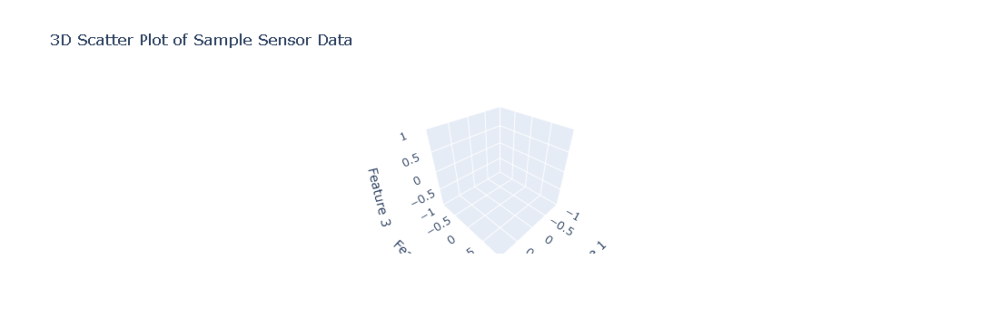

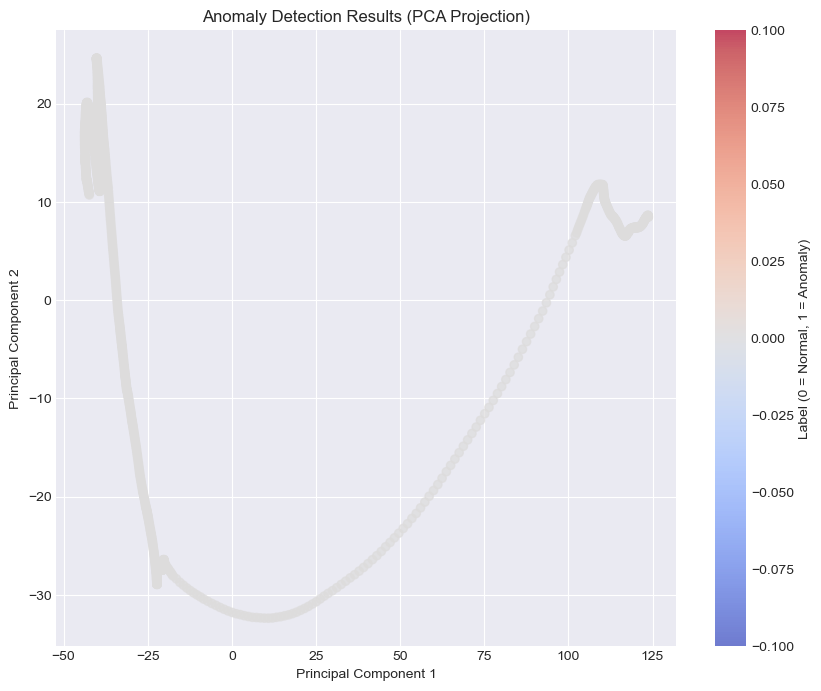

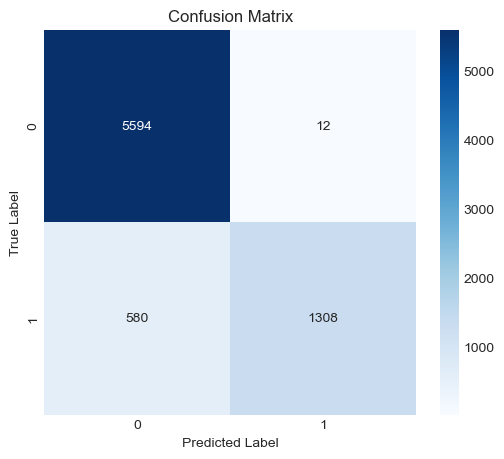

Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95      5606
           1       0.99      0.69      0.82      1888

    accuracy                           0.92      7494
   macro avg       0.95      0.85      0.88      7494
weighted avg       0.93      0.92      0.92      7494

! All visualizations generated and saved to 'report_materials/'


In [38]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, classification_report

# Create output folder if not exists
os.makedirs('report_materials', exist_ok=True)

# ----------------------------------------------------------------------
# 1️ Interactive 3D Visualization (Plotly)
# ----------------------------------------------------------------------
def plot_interactive_3d(data):
    """3D scatter plot for first 3 features"""
    fig = go.Figure(data=[
        go.Scatter3d(
            x=data[:, 0],
            y=data[:, 1],
            z=data[:, 2],
            mode='markers',
            marker=dict(size=3, color=data[:, 0], colorscale='Viridis', opacity=0.7)
        )
    ])
    fig.update_layout(
        title='3D Scatter Plot of Sample Sensor Data',
        scene=dict(
            xaxis_title='Feature 1',
            yaxis_title='Feature 2',
            zaxis_title='Feature 3'
        )
    )
    fig.write_html('report_materials/3D_scatter_plot.html')
    fig.show()


# ----------------------------------------------------------------------
# 2️ Anomaly Detection Visualization (PCA)
# ----------------------------------------------------------------------
def plot_anomaly_detection(data, labels):
    """Visualize anomalies after PCA 2D reduction"""
    data = data.reshape(data.shape[0], -1)
    pca = PCA(n_components=2)
    data_pca = pca.fit_transform(data)

    plt.figure(figsize=(10, 8))
    plt.scatter(data_pca[:, 0], data_pca[:, 1], c=labels, cmap='coolwarm', alpha=0.7)
    plt.title('Anomaly Detection Results (PCA Projection)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(label='Label (0 = Normal, 1 = Anomaly)')
    plt.savefig('report_materials/anomaly_detection_pca.png', dpi=300, bbox_inches='tight')
    plt.show()


# ----------------------------------------------------------------------
# 3️ Model Performance Visualization
# ----------------------------------------------------------------------
def plot_model_performance(y_test, y_pred):
    """Visualize confusion matrix and print classification report"""
    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.savefig('report_materials/confusion_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("Classification Report:")
    print(classification_report(y_test, y_pred))


# ----------------------------------------------------------------------
# 4️ Time-Series Anomaly Visualization
# ----------------------------------------------------------------------
def plot_time_series_anomaly(data, timestamps, labels):
    """Plot time-series with detected anomalies marked"""
    labels = np.array(labels)
    plt.figure(figsize=(12, 6))
    plt.plot(timestamps, data, label='Normal Data', color='blue')
    plt.scatter(timestamps[labels == 1], data[labels == 1], color='red', label='Anomaly', s=25)
    plt.title('Time Series Anomaly Detection')
    plt.xlabel('Timestamp')
    plt.ylabel('Sensor Value')
    plt.legend()
    plt.savefig('report_materials/time_series_anomaly.png', dpi=300, bbox_inches='tight')
    plt.show()


# ----------------------------------------------------------------------
# 5️ Run All Visualizations
# ----------------------------------------------------------------------
if results is not None:
    print("\n GENERATING ADVANCED VISUALIZATIONS (AUTO-SAVE ENABLED)...")

    plot_interactive_3d(X_test[:1000])
    plot_anomaly_detection(X_test[:1000], y_test[:1000])
    plot_model_performance(y_test, results['predictions'][:len(y_test)])

    # Optional — only if you have time-series data
    # plot_time_series_anomaly(processed_df['value'], processed_df['timestamp'], processed_df['anomaly'])

    print("! All visualizations generated and saved to 'report_materials/'")


In [40]:
!pip install flask-cors


In [63]:
import requests

print("🔹 PING TEST:")
print(requests.get("http://127.0.0.1:5000/ping").json())

print("\n🔹 HEALTH CHECK:")
print(requests.get("http://127.0.0.1:5000/health").json())

print("\n🔹 MODEL INFO:")
print(requests.get("http://127.0.0.1:5000/model_info").json())


🔹 PING TEST:
{'message': 'API is alive!', 'time': '2025-11-12T01:45:45.561283'}

🔹 HEALTH CHECK:
{'model_info': {'accuracy': 0.9210034694422204, 'dataset': 'NASA Bearing - 52 Sensors', 'f1_score': 0.8154613466334164, 'model_architecture': 'LSTM Autoencoder', 'n_features': 51, 'precision': 0.990909090909091, 'recall': 0.6927966101694916, 'sequence_length': 100, 'threshold': 7.0869864515054575, 'training_date': '2025-11-11 20:03:40'}, 'model_loaded': True, 'status': 'healthy', 'timestamp': '2025-11-12T01:45:45.573740'}

🔹 MODEL INFO:
{'accuracy': 0.9210034694422204, 'dataset': 'NASA Bearing - 52 Sensors', 'f1_score': 0.8154613466334164, 'model_architecture': 'LSTM Autoencoder', 'n_features': 51, 'precision': 0.990909090909091, 'recall': 0.6927966101694916, 'sequence_length': 100, 'threshold': 7.0869864515054575, 'training_date': '2025-11-11 20:03:40'}


In [64]:
import numpy as np, requests

info = requests.get("http://127.0.0.1:5000/model_info").json()
seq_len = info["sequence_length"]
n_features = info["n_features"]

# Create dummy test data (simulate real sensor readings)
dummy_data = np.random.normal(0, 1, (seq_len + 10, n_features)).tolist()

payload = {"sensor_data": dummy_data}
response = requests.post("http://127.0.0.1:5000/predict", json=payload)
print(response.json())


{'predictions': {'anomalies_detected': 11, 'anomaly_positions': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 'anomaly_rate': 1.0, 'total_sequences': 11}, 'statistics': {'max_error': 141.0436056189549, 'mean_error': 140.79039621870817, 'min_error': 140.61838462373734, 'threshold': 7.0869864515054575}, 'success': True, 'timestamp': '2025-11-12T01:46:48.227016'}
